In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import figure
from matplotlib.pyplot import suptitle
import matplotlib.style as style
from IPython.display import display, HTML
import warnings
%config InlineBackend.figure_format = 'png' #set 'png' here when working on notebook
warnings.filterwarnings('ignore') 

# Set some parameters to get good visuals - style to ggplot and size to 15,10

pd.set_option('display.width',170, 'display.max_rows',200, 'display.max_columns',900)

In [2]:
df = pd.read_csv("/Users/pvaish10/Desktop/TADPOLE_D1_D2.csv")

In [3]:
df1 = df[['RID', 'PTID', 'VISCODE','D1', 'D2','DX','EXAMDATE','Years_bl','Month','AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG','AV45',
         'CDRSB','ADAS11','MMSE', 'RAVLT_immediate','Hippocampus', 'WholeBrain','Entorhinal', 'MidTemp','ABETA_UPENNBIOMK9_04_19_17',
         'TAU_UPENNBIOMK9_04_19_17','PTAU_UPENNBIOMK9_04_19_17']]

In [5]:
df1.head(1)

,RID,PTID,VISCODE,D1,D2,DX,EXAMDATE,Years_bl,Month,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,FDG,AV45,CDRSB,ADAS11,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,ABETA_UPENNBIOMK9_04_19_17,TAU_UPENNBIOMK9_04_19_17,PTAU_UPENNBIOMK9_04_19_17
0,2,011_S_0002,bl,1,1,NL,2005-09-08,0.0,0,74.3,Male,16,Not Hisp/Latino,White,Married,0.0,1.36926,NaN,0.0,10.67,28.0,44.0,8336.0,1229740.0,4177.0,27936.0,,,


#### Select rows which have a DX value

In [6]:
df2 = df1.loc[df1['DX'].notnull()]

#### Make only three categories

In [7]:
df2 = df2.replace({'NL to MCI': 'MCI', 'MCI to Dementia': 'Dementia', 'MCI to NL' : 'NL', 'NL to Dementia': 'Dementia', 'Dementia to MCI': 'MCI'})

In [8]:
df2['DX'].value_counts()

MCI         4052
NL          2745
Dementia    2107
Name: DX, dtype: int64

#### Update the age as per the exam and diagnosis

In [9]:
df2['AGE_UPDATED'] = np.round(df2['AGE'] + df2['Years_bl'], 2)

In [13]:
df2.columns

Index(['RID', 'PTID', 'VISCODE', 'D1', 'D2', 'DX', 'EXAMDATE', 'Years_bl', 'Month', 'AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED'],
      dtype='object')

#### How many examples are there

In [10]:
df2['D1'][df2['D1'] == 1].shape

(8841,)

In [11]:
df2['D1'][df2['D1'] == 0].shape

(63,)

In [12]:
df2['D2'][df2['D2'] == 1].shape

(5177,)

In [13]:
df2['D2'][df2['D2'] == 0].shape

(3727,)

In [14]:
df2.head(1)

,RID,PTID,VISCODE,D1,D2,DX,EXAMDATE,Years_bl,Month,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,FDG,AV45,CDRSB,ADAS11,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,ABETA_UPENNBIOMK9_04_19_17,TAU_UPENNBIOMK9_04_19_17,PTAU_UPENNBIOMK9_04_19_17,AGE_UPDATED
0,2,011_S_0002,bl,1,1,NL,2005-09-08,0.0,0,74.3,Male,16,Not Hisp/Latino,White,Married,0.0,1.36926,NaN,0.0,10.67,28.0,44.0,8336.0,1229740.0,4177.0,27936.0,,,,74.3


### Select the columns

In [15]:
df2.columns

Index(['RID', 'PTID', 'VISCODE', 'D1', 'D2', 'DX', 'EXAMDATE', 'Years_bl', 'Month', 'AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED'],
      dtype='object')

In [37]:
df2['ABETA_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df2['ABETA_UPENNBIOMK9_04_19_17'], errors='coerce')
df2['TAU_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df2['TAU_UPENNBIOMK9_04_19_17'], errors='coerce')
df2['PTAU_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df2['PTAU_UPENNBIOMK9_04_19_17'], errors='coerce')

In [38]:
df3 = df2[['D1', 'D2', 'DX',  'PTGENDER', 'PTEDUCAT', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED']]

In [39]:
df3 = df3.replace({'NL': 1 , 'MCI': 2, 'Dementia': 3})

In [40]:
categorial_cols = [
    'PTGENDER']

for cc in categorial_cols:
    dummies = pd.get_dummies(df3[cc])
    dummies = dummies.add_prefix("{}#".format(cc))
    df3.drop(cc, axis=1, inplace=True)
    df3 = df3.join(dummies)

In [41]:
df3.columns

Index(['D1', 'D2', 'DX', 'PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male'],
      dtype='object')

In [42]:
predictors = ['D1', 'D2','PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']


In [108]:
train_X = df3[predictors][df3['D1'] == 1]
train_X = train_X[['PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']]
test_X = df3[predictors][df3['D2'] == 1]
test_X = test_X[['PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']]


train_y = df3.DX[df3['D1'] == 1]
test_y = df3.DX[df3['D2'] == 1]

In [109]:
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import Imputer
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [110]:
#!pip install xgboost

In [111]:
#Impute missing values after train test split
my_imputer = SimpleImputer()
train_X_imputed = pd.DataFrame(my_imputer.fit_transform(train_X.values))
test_X_imputed = pd.DataFrame(my_imputer.fit_transform(test_X.values))


In [112]:
from sklearn.metrics import roc_auc_score
def multiclass_roc_dict(y_test,y_pred):
    #creating a set of all the unique classes using the actual class list
    unique_class = set(y_test.values)
    roc_auc_dict = {}
    for per_class in unique_class:
        #creating a list of all the classes except the current class 
        other_class = [x for x in unique_class if x != per_class]

        #marking the current class as 1 and all other classes as 0
        new_actual_class = [0 if x in other_class else 1 for x in y_test]
        new_pred_class = [0 if x in other_class else 1 for x in y_pred]

        #using the sklearn metrics method to calculate the roc_auc_score
        roc_auc = roc_auc_score(new_actual_class, new_pred_class, average = 'macro')
        roc_auc_dict[per_class] = roc_auc
    return roc_auc_dict

In [113]:
# Decision Tree
def get_multiclass_roc_dict(max_leaf_nodes, train_X, test_X, train_y, test_y):
    model = DecisionTreeClassifier(max_leaf_nodes=max_leaf_nodes, random_state=0)
    model.fit(train_X, train_y)
    preds_y = model.predict(test_X)
    multiclass_roc = multiclass_roc_dict(test_y, preds_y)
    return(multiclass_roc)

In [114]:
print("Decision Tree results with different number of leaf nodes:")
for max_leaf_nodes in [5, 50, 500, 5000,50000]:
    my_multiclass_roc_dict = get_multiclass_roc_dict(max_leaf_nodes, train_X_imputed, test_X_imputed, train_y, test_y)
    print("Max leaf nodes: %d" %(max_leaf_nodes))
    print(my_multiclass_roc_dict)

Decision Tree results with different number of leaf nodes:
Max leaf nodes: 5
{1: 0.9050928183064011, 2: 0.8619651786814209, 3: 0.9364283293798712}
Max leaf nodes: 50
{1: 0.9220183078965264, 2: 0.8889012728188237, 3: 0.9185634063859363}
Max leaf nodes: 500
{1: 0.9501778982492419, 2: 0.9306889631226998, 3: 0.9571751879335265}
Max leaf nodes: 5000
{1: 0.9636620902117489, 2: 0.9486117489956308, 3: 0.9663320631539637}
Max leaf nodes: 50000
{1: 0.9636620902117489, 2: 0.9486117489956308, 3: 0.9663320631539637}


In [115]:
# Random Forest
forest_model = RandomForestClassifier(random_state=99)
forest_model.fit(train_X_imputed, train_y)
preds_y = forest_model.predict(test_X_imputed)
print("Random Forest Results")
print(multiclass_roc_dict(test_y, preds_y))

Random Forest Results
{1: 0.9576049671322042, 2: 0.9466186339623274, 3: 0.9553831630924141}


In [116]:
# XGBoost
my_pipeline = make_pipeline(SimpleImputer(),XGBClassifier())
my_pipeline.fit(train_X, train_y)
preds_y = my_pipeline.predict(test_X)
print("XGBoost Results")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results
{1: 0.9178898566689335, 2: 0.8919538492543329, 3: 0.9196647279718394}


In [117]:
# XGBoost with parameters tuning 
xgb_model = XGBClassifier(n_estimators=1000)
xgb_model.fit(train_X_imputed, train_y, early_stopping_rounds=5, 
             eval_set=[(test_X_imputed, test_y)], verbose=False)
preds_y = xgb_model.predict(test_X_imputed)
print("XGBoost Results with Parameter Tuning")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results with Parameter Tuning
{1: 0.9062932148196515, 2: 0.880824982029597, 3: 0.8986778954211301}


In [121]:
from sklearn.metrics import classification_report
# XGBoost with parameters tuning 
xgb_model = XGBClassifier(n_estimators=100)
xgb_model.fit(train_X_imputed, train_y, early_stopping_rounds=5, 
             eval_set=[(test_X_imputed, test_y)], verbose=False)
preds_y = xgb_model.predict(test_X_imputed)
print("Classification Report : {}".format(classification_report(test_y, preds_y, labels=[1, 2, 3])))

Classification Report :               precision    recall  f1-score   support

           1       0.93      0.85      0.89      2059
           2       0.84      0.92      0.88      2481
           3       0.87      0.81      0.84       637

   micro avg       0.88      0.88      0.88      5177
   macro avg       0.88      0.86      0.87      5177
weighted avg       0.88      0.88      0.88      5177



### Code:
    https://www.kaggle.com/akshita72/alzheimers-prediction

In [119]:
#!pip install shap

### https://github.com/slundberg/shap

In [126]:
import shap
import xgboost

# load JS visualization code to notebook
shap.initjs()

model = xgboost.train({"learning_rate": 0.01, "n_estimators": 100, "eval_set":[(test_X, test_y)] }, xgboost.DMatrix(train_X, train_y), 100)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_X.iloc[0,:])

In [127]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, train_X)

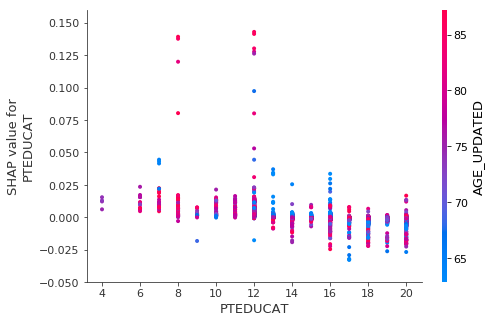

In [128]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("PTEDUCAT", shap_values, train_X)

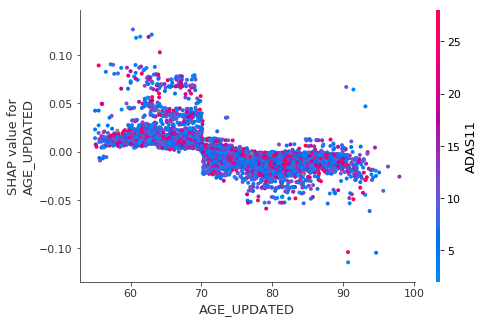

In [129]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("AGE_UPDATED", shap_values, train_X)

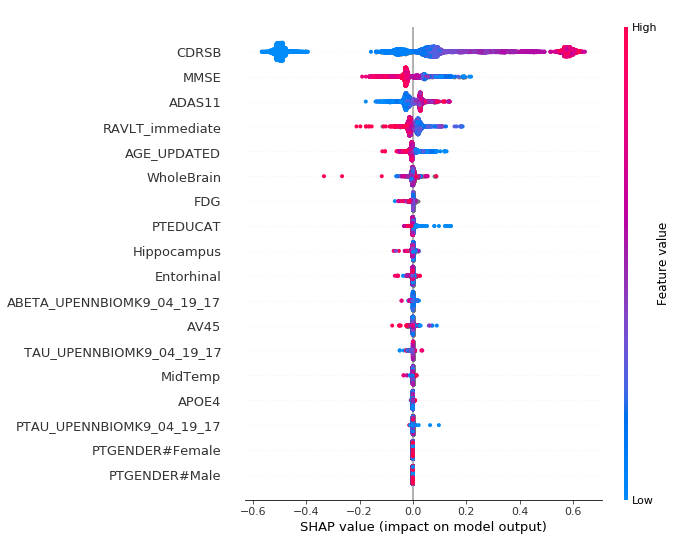

In [130]:
# summarize the effects of all the features
shap.summary_plot(shap_values, train_X)

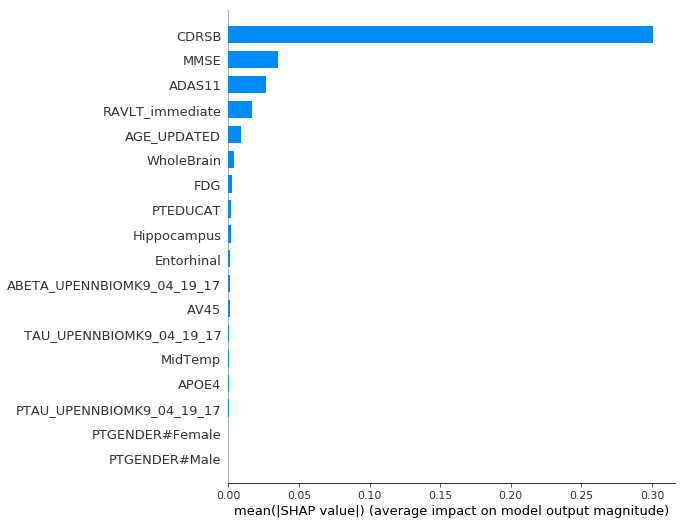

In [131]:
shap.summary_plot(shap_values, train_X, plot_type="bar")